# DLBDSMLUSL01
## Case Study: : Mental Health in Technology-related Jobs

Datafile used: mental-heath-in-tech-2016_20161114.csv
Link to dataset: https://www.kaggle.com/osmi/mental-health-in-tech-2016

Notebook with the execution of the unsupervised machine learning techniques to extract the data and clusters used for the mentioned case study

File may contain some outdated code too, which not contribute anymore. Possible leftover from finding the clusters

## import required modules

In [1]:
import pandas as pd

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

### read the data file. File was renamed before and copied, so it is easier to import it

In [2]:
data = pd.read_csv('./data_raw.csv', delimiter=",")

# seems we have a wrong encoding in one column title, need to remove
data.rename(columns={'Do you have medical coverage (private insurance or state-provided) which includes treatment of  mental health issues?': 'Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?'}, inplace=True)

# we can use a binary mapper later, as we have often entires with only NaN/Yes/No.
# when mapping them on own already we can remove this textual data and use it in binary
binary_mapper = {"No": 0, "Yes": 1}


# %% start the data preparation
# remove all who are self employed, we want data for the employed as we make a program for those with this data
data = data[data['Are you self-employed?'] == 0]

# we also have some connected features which was only asked to self-employed. we can remove those too as they are empty now
data.dropna(how="all", axis=1, inplace=True)
# also drop row for self employed, as no value anymore
data.drop('Are you self-employed?',axis=1, inplace=True)

# filter first all items out, where the age shows an unrelevant state (below 16 years and above 80)
data = data[(data['What is your age?'] >= 16) & (data['What is your age?'] <= 80)]

In [3]:
X = data.copy()

## prepare the data

In [4]:
# dropping all columns depending on a previous question with gives only more details in those. We will use them for analyze after buuilding the clusters. They don´t add value to our clusters
drop_columns = [
    'Why or why not?',
    'Why or why not?.1',
    'If yes, what condition(s) have you been diagnosed with?',
    'If maybe, what condition(s) do you believe you have?',
    'If so, what condition(s) were you diagnosed with?',
    'What US state or territory do you live in?',
    'What US state or territory do you work in?',
    'Is your employer primarily a tech company/organization?'
]

X.drop(columns=drop_columns, axis=1, inplace=True)

# rename columns
header_name_list = {
    'How many employees does your company or organization have?': 'no_employees',
    'Is your primary role within your company related to tech/IT?': 'primary_it_role',
    'Does your employer provide mental health benefits as part of healthcare coverage?': 'employer_provide_coverage',
    'Do you know the options for mental health care available under your employer-provided coverage?': 'coverage_options_known',
    'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?': 'employer_discussed_healthcare',
    'Does your employer offer resources to learn more about mental health concerns and options for seeking help?': 'employer_offered_ressources',
    'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?': 'anonymity_protected_using_resources',
    'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:': 'request_medical_leave_difficulty', # quantative
    'Do you think that discussing a mental health disorder with your employer would have negative consequences?': 'negative_consequences_discuss_mental_employer',
    'Do you think that discussing a physical health issue with your employer would have negative consequences?': 'negative_consequences_discuss_physical_employer',
    'Would you feel comfortable discussing a mental health disorder with your coworkers?': 'discuss_mental_coworker_feeling_comfortable',
    'Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?': 'discuss_mental_supervisor_feeling_comfortable',
    'Do you feel that your employer takes mental health as seriously as physical health?': 'mental_pyhsical_serious_employer',
    'Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?': 'consequences_coworker_open_speaking',
    'Do you have previous employers?': 'previous_employers',
    'Have your previous employers provided mental health benefits?': 'previous_employers_mental_benefits',
    'Were you aware of the options for mental health care provided by your previous employers?': 'previous_employers_mental_options_awareness',
    'Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?': 'previous_employer_discussed_healthcare',
    'Did your previous employers provide resources to learn more about mental health issues and how to seek help?': 'previous_employer_offered_ressources',
    'Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?': 'previous_employer_anonymity_protected_using_resources',
    'Do you think that discussing a mental health disorder with previous employers would have negative consequences?': 'previous_employer_negative_consequences_discuss_mental_employer',
    'Do you think that discussing a physical health issue with previous employers would have negative consequences?': 'previous_employer_negative_consequences_discuss_physical_employer',
    'Would you have been willing to discuss a mental health issue with your previous co-workers?': 'discuss_mental_previous_coworker_feeling_willing',
    'Would you have been willing to discuss a mental health issue with your direct supervisor(s)?': 'discuss_mental_previous_supervisor_feeling_willing',
    'Did you feel that your previous employers took mental health as seriously as physical health?': 'mental_pyhsical_serious_previous_employer',
    'Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?': 'consequences_previous_coworker_open_speaking',
    'Would you be willing to bring up a physical health issue with a potential employer in an interview?': 'inform_physical_interview',
    'Would you bring up a mental health issue with a potential employer in an interview?': 'inform_mental_interview',
    'Do you feel that being identified as a person with a mental health issue would hurt your career?': 'identified_mental_carrer_issues',
    'Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?': 'coworker_view_negativly',
    'How willing would you be to share with friends and family that you have a mental illness?': 'share_friends',
    'Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?': 'observed_bad_response',
    'Have your observations of how another individual who discussed a mental health disorder made you less likely to reveal a mental health issue yourself in your current workplace?': 'observed_bad_response_influence',
    'Do you have a family history of mental illness?': 'mental_family_history',
    'Have you had a mental health disorder in the past?': 'mental_past',
    'Do you currently have a mental health disorder?': 'mental_actual',
    'Have you been diagnosed with a mental health condition by a medical professional?': 'diagnosed_professional',
    'Have you ever sought treatment for a mental health issue from a mental health professional?': 'sought_treatment_professional',
    'If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?': 'interfere_work_treatment',
    'If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?': 'interfere_work_no_treatment',
    'What is your age?': 'age',
    'What is your gender?': 'gender',
    'What country do you live in?': 'country_live',
    'What country do you work in?': 'country_work',
    'Which of the following best describes your work position?': 'work_position',
    'Do you work remotely?': 'work_remotely'
}

X.rename(columns=header_name_list, inplace=True)

### clean up gender

In [5]:
# clean up gender. we want this feature simpler as so we make 3 types: male (m), female (f), other (o)
# for so replace items in it. We also fill all NaN with o, as we don´t know where to match it, and assume the reason not toll may be not sure about it
simple_gender = {
   "Male" : "m",
   "male" : "m",
   "Male " : "m",
   "male " : "m",
   "M" : "m",
   "man" : "m",
   "Man" : "m",
   "MALE" : "m",
   "Male." : "m",
   "Cis male" : "m",
   "Male (cis)" : "m",
   "Sex is male" : "m",
   "cis male" : "m",
   "Dude" : "m",
   "cisdude" : "m",
   "cis man" : "m",
   "M|" : "m",
   "Cis Male" : "m",
   "I'm a man why didn't you make this a drop down question. You should of asked sex? And I would of answered yes please. Seriously how much text can this take? " : "m",
   "Malr" : "m", # seems clearly a typowhen looking on keyboard layout
   "Female" : "f",
   "female" : "f",
   "I identify as female." : "f",
   "female" : "f",
   "female " : "f",
   "Female assigned at birth " : "f",
   "F" : "f",
   "Woman" : "f",
   "female-bodied; no feelings about gender" : "f",
   "Female " : "f",
   "Female or Multi-Gender Femme" : "f",
   "woman" : "f",
   "female/woman" : "f",
   "AFAB" : "f",
   "Cis-woman" : "f",
   "Cis female " : "f",
   "Cisgender Female" : "f",
   "fem" : "f",
   " Female" : "f",
   "Female (props for making this a freeform field, though)" : "f",
   "Bigender" : "o",
   "non-binary" : "o",
   "fm" : "o",
   "Other/Transfeminine" : "o",
   "male 9:1 female, roughly" : "o",
   "Other" : "o",
   "Androgynous" : "o",
   "none of your business" : "o",
   "Genderfluid" : "o",
   "genderqueer" : "o",
   "Human" : "o",
   "human" : "o",
   "nb masculine" : "o",
   "Enby" : "o",
   "Queer" : "o",
   "Agender" : "o",
   "Nonbinary" : "o",
   "Unicorn" : "o",
   "Genderqueer" : "o",
   "Fluid" : "o",
   "mail" : "o", # even believe this person mean male, as unsure bring it better here
   "Transitioned, M2F" : "o", # all here coming now are normally a gender, but as they changed it, it may have an influence later in the data, keep them in o maybe shows some insight for it
   "Genderfluid (born female)" : "o",
   "genderqueer woman" : "o",
   "Male/genderqueer" : "o",
   "Male (trans, FtM)" : "o",
   "Genderflux demi-girl" : "o",
   "Transgender woman" : "o"
}

X['gender'] = X['gender'].map(simple_gender)
X['gender'] = X['gender'].fillna('o')

#### Explore some data (EDA)

Draw some charts, we want to use in the paper. Other data was explored before in another script, before working on the data

<Axes: xlabel='gender'>

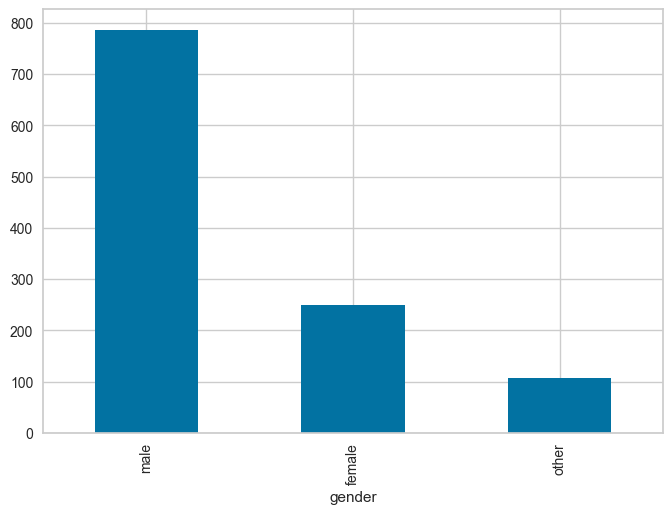

In [6]:
gender_data = X['gender'].map({
    'm': 'male',
    'f': 'female',
    'o': 'other',
})

gender_data.value_counts().plot(kind='bar')


<Axes: xlabel='work_remotely'>

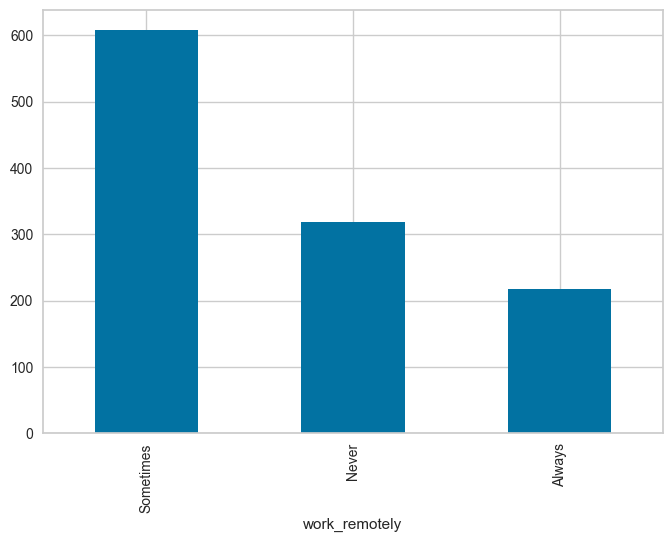

In [7]:
X['work_remotely'].value_counts().plot(kind='bar')

C:\Users\Thomas\AppData\Local\Temp\ipykernel_22484\1747594353.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=X, x='age', bins=30, kde=True, multiple="dodge", palette="Set2")


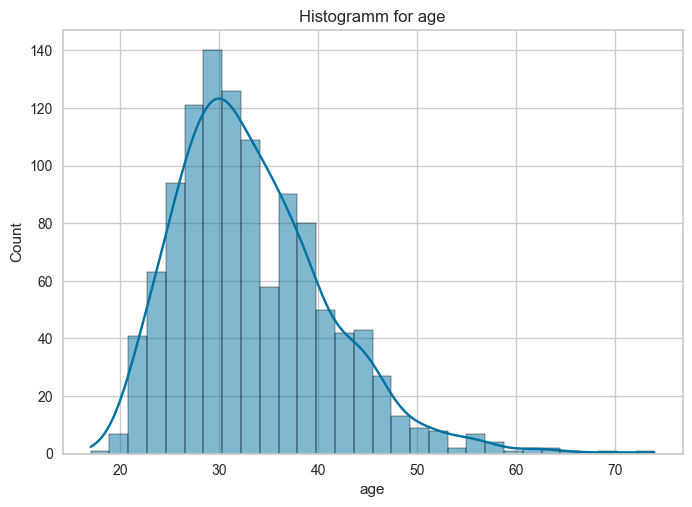

In [8]:
sns.histplot(data=X, x='age', bins=30, kde=True, multiple="dodge", palette="Set2")
plt.title(f'Histogramm for age')
plt.show()

<Axes: xlabel='mental_actual'>

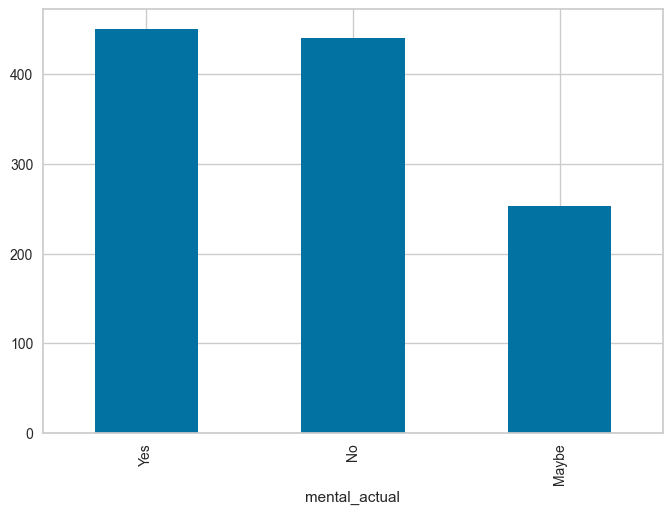

In [9]:
X['mental_actual'].value_counts().plot(kind='bar')

<Axes: xlabel='mental_past'>

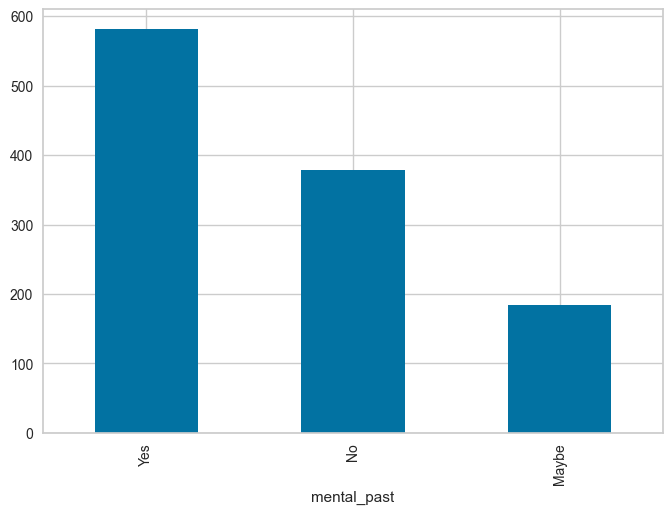

In [10]:
X['mental_past'].value_counts().plot(kind='bar')

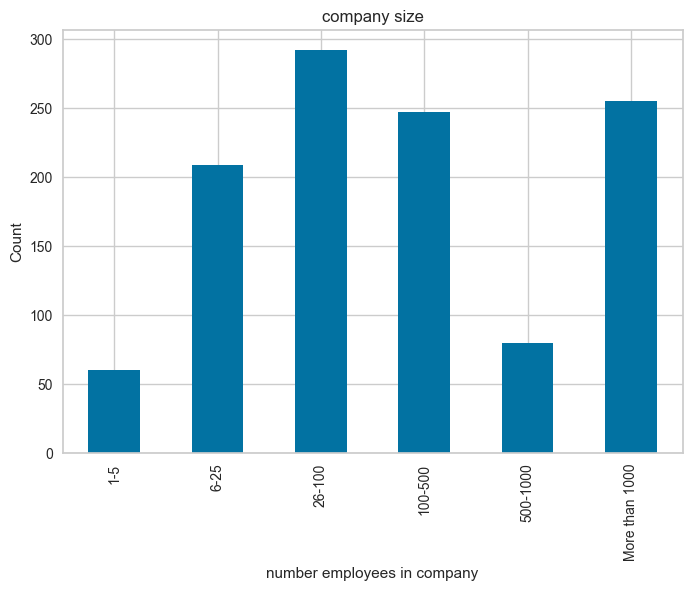

In [11]:
no_employee_value_counts = X['no_employees'].value_counts()

# Define the desired order for the bars
no_employee_desired_order = ['1-5', '6-25', '26-100', '100-500', '500-1000', 'More than 1000']

# Create a bar plot with the specified order
no_employee_value_counts.loc[no_employee_desired_order].plot(kind='bar')

# Set the title and labels
plt.title('company size')
plt.xlabel('number employees in company')
plt.ylabel('Count')

# Display the plot
plt.show()

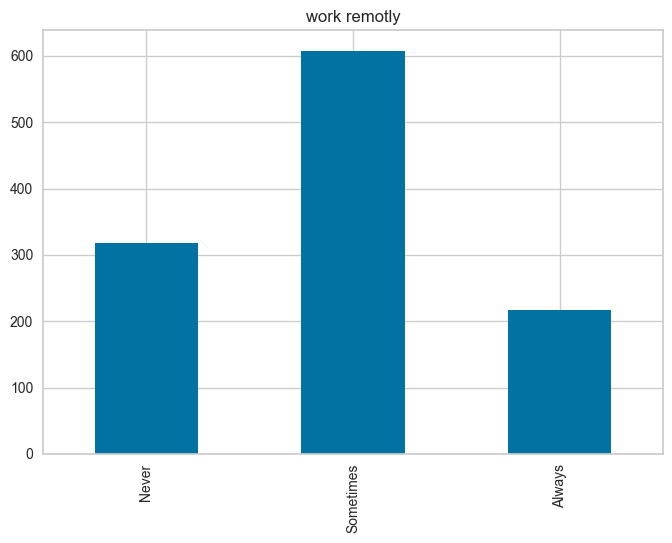

In [12]:
work_remote_value_counts = X['work_remotely'].value_counts()

# Define the desired order for the bars
work_remote_desired_order = ['Never', 'Sometimes', 'Always']

# Create a bar plot with the specified order
work_remote_value_counts.loc[work_remote_desired_order].plot(kind='bar')

# Set the title and labels
plt.title('work remotly')
plt.xlabel('')

# Display the plot
plt.show()

<Axes: ylabel='work_position'>

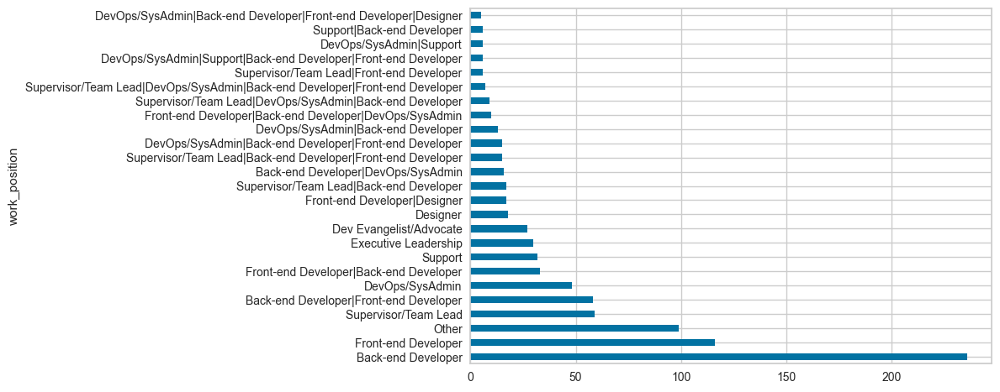

In [13]:
# show top 25 as the rest have below 5 per each so minor

top20_work_position = X['work_position'].value_counts().head(25)
top20_work_position.plot(kind='barh')

<Axes: ylabel='country_live'>

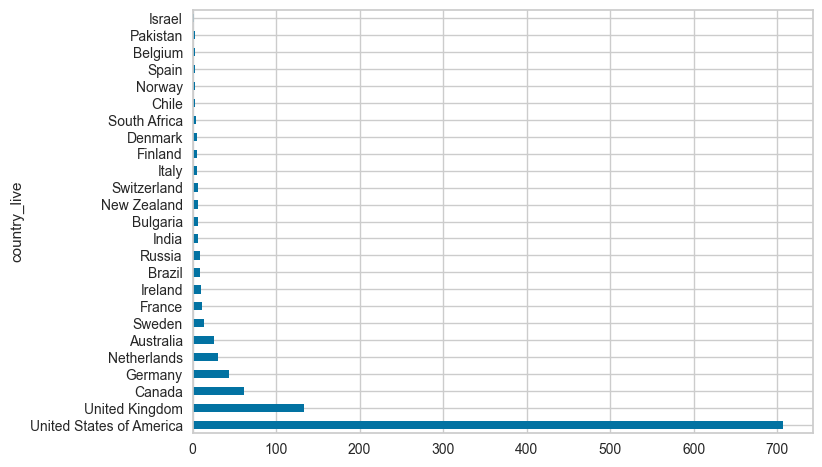

In [14]:
# show top 25 as the rest have below 5 per each so minor

top20_work_position = X['country_live'].value_counts().head(25)
top20_work_position.plot(kind='barh')

### create a new feature to support if a mental health from the past was cured

In [15]:
# create new dataset for cured (had in past but not now anymore)

X = X.assign(mental_cured=lambda x: x.apply(lambda row: 1 if (row['mental_actual'] == "No") and (row['mental_past'] != "No") else 0, axis=1))

### do one-hot-encoding for certain tables

In [16]:
one_hot_features = ['gender', 
                     'mental_family_history',
                     'mental_actual',
                    'employer_provide_coverage'
                   ]
df_hotencode = X[one_hot_features]

data_one_hot = pd.get_dummies(df_hotencode)
X = pd.concat([X.reset_index(drop=True), data_one_hot.reset_index(drop=True)], axis=1)
X.drop(columns=one_hot_features, axis=1, inplace=True)

### encode ordinal data

In [17]:
friend_mapper = {
    'Very open': 5,
    'Somewhat open': 4,
    'Neutral': 3,
    'Somewhat not open': 2,
    'Not open at all' : 1,
    'Not applicable to me (I do not have a mental illness)': -1
}

X['share_friends'] = X['share_friends'].map(friend_mapper)

leave_difficult_mapper = {
    'Very easy': 5,
    'Somewhat easy': 4,
    'Neither easy nor difficult': 3,
    'Somewhat difficult': 2,
    'Very difficult' : 1,
    'I don\'t know': -1
}

X['request_medical_leave_difficulty'] = X['request_medical_leave_difficulty'].map(leave_difficult_mapper)

interfere_treatment_mapper = {
    'Often': 4,
    'Sometimes': 3,
    'Rarely': 2,
    'Never' : 1,
    'Not applicable to me': -1
}

X['interfere_work_no_treatment'] =X['interfere_work_no_treatment'].map(interfere_treatment_mapper)
X['interfere_work_treatment'] = X['interfere_work_treatment'].map(interfere_treatment_mapper)

X['share_friends'] = StandardScaler().fit_transform(X[['share_friends']])
X['request_medical_leave_difficulty'] = StandardScaler().fit_transform(X[['request_medical_leave_difficulty']]) 
X['interfere_work_no_treatment'] = StandardScaler().fit_transform(X[['interfere_work_no_treatment']])
X['interfere_work_treatment'] = StandardScaler().fit_transform(X[['interfere_work_treatment']] )


#### combine features with follow up questions by feature engeneering

Actually not used as the result was not helpful and increased the features a lot. Keept in comment out state if need it later maybe again.

In [18]:
# from sklearn.preprocessing import PolynomialFeatures

# previous_employer_pairs = [
#     ('previous_employers','previous_employers_mental_benefits'),
#     ('previous_employers','previous_employers_mental_options_awareness'),
#     ('previous_employers','previous_employer_discussed_healthcare'),
#     ('previous_employers','previous_employer_offered_ressources'),
#     ('previous_employers','previous_employer_anonymity_protected_using_resources'),
#     ('previous_employers','previous_employer_negative_consequences_discuss_mental_employer'),
#     ('previous_employers','previous_employer_negative_consequences_discuss_physical_employer'),
#     ('previous_employers','discuss_mental_previous_coworker_feeling_willing'),
#     ('previous_employers','discuss_mental_previous_supervisor_feeling_willing'),
#     ('previous_employers','mental_pyhsical_serious_previous_employer'),
#     ('previous_employers','consequences_previous_coworker_open_speaking')
# ]


# appended_df = pd.DataFrame()
# for previous_employer_pair in previous_employer_pairs:

#     features_to_transform = X[list(previous_employer_pair)]
#     selected_df = pd.get_dummies(features_to_transform)

#     # Use PolynomialFeatures to create polynomial features
#     degree = 2  # Set the degree of the polynomial
#     poly = PolynomialFeatures(degree=degree, include_bias=False, interaction_only=True)
#     poly_features = poly.fit_transform(selected_df)
#     poly_feature_names = poly.get_feature_names_out(selected_df.columns)
#     X_poly = pd.DataFrame(poly_features, columns=poly_feature_names)

#     appended_df = pd.concat([appended_df, X_poly], axis=1)
#     X.drop(previous_employer_pair[1], axis=1, inplace=True)


# X = pd.concat([X, appended_df], axis=1)
# X.drop(columns='previous_employers', axis=1, inplace=True)


#### drop features we found, influence the clsutering negativly (build models and tested where the Silloutte score raised the most iteratively)

In [19]:
X.drop('primary_it_role', axis=1, inplace=True)
X.drop('work_position', axis=1, inplace=True)
X.drop('no_employees', axis=1, inplace=True)

#### finally encode and scale all features not done so far

In [20]:
for col in X.columns:
    if X[col].dtype == 'object': 
        X[col] = LabelEncoder().fit_transform(X[col])


    X[col] = MinMaxScaler().fit_transform(X[[col]])

### Build and evaluate the model and clusters

In [21]:
# run PCA to reduce the features to the best results we found previous automated
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

X_pca = pd.DataFrame(X_pca)

0.6078530886536053


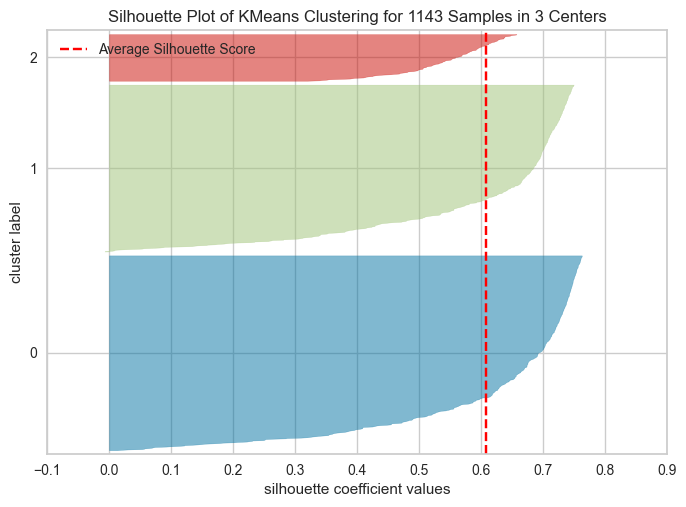

In [22]:
# build the clusters, similar with the best found parameter previously
kmeans = KMeans(n_clusters=3, n_init='auto', random_state=42).fit(X_pca)
labels = kmeans.labels_

S = silhouette_score(X_pca, labels)
print(S)

visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X_pca)        
visualizer.show()

# assign cluster to the data
X['cluster'] = labels
data['cluster'] = labels

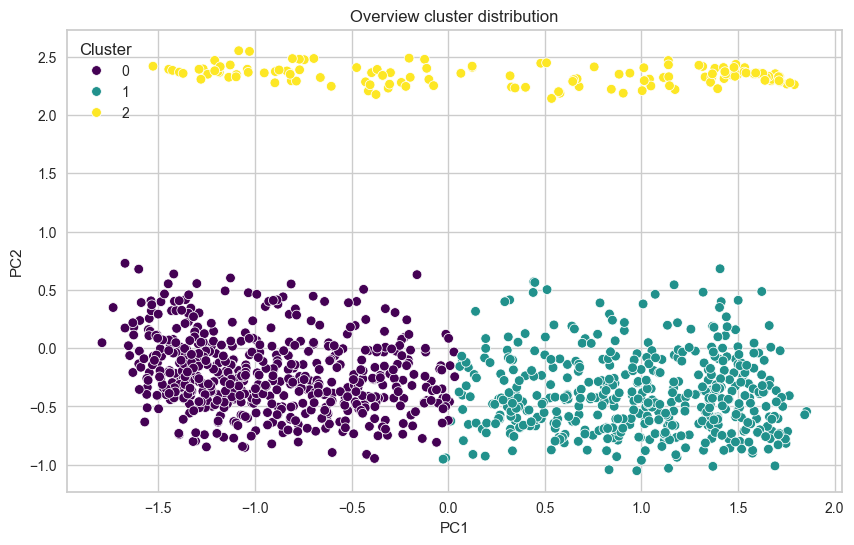

In [23]:
# extract featured again, without the found cluster column
features = X.drop(columns=['cluster'], axis=1) 

# do PCA with 2 components for 2D chart
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

df_pca = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
df_pca['Cluster'] = X['cluster']

# draw it
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=df_pca, palette='viridis')
plt.title('Overview cluster distribution')
plt.show()


### evaluate the results inside the cluster

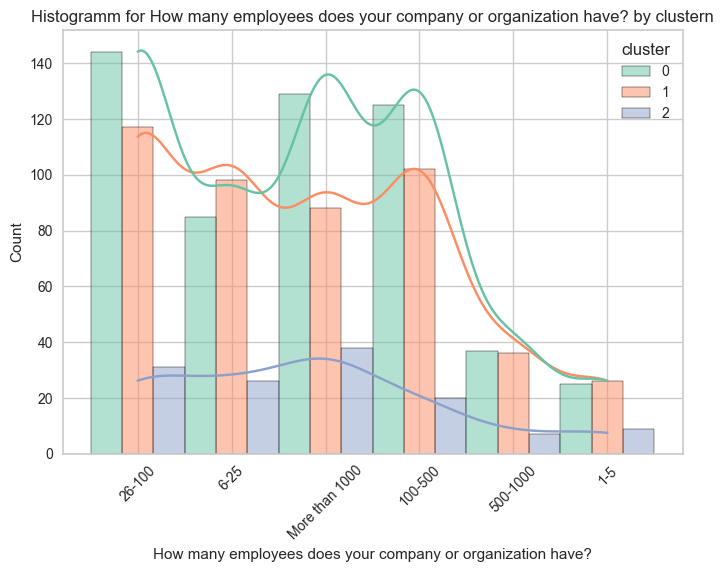

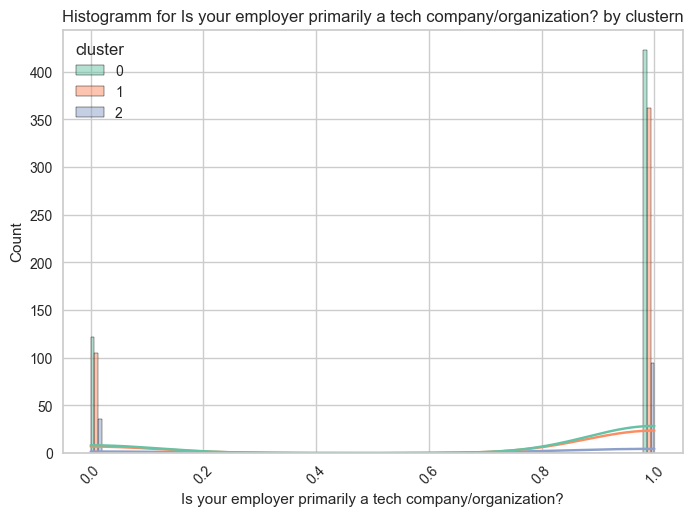

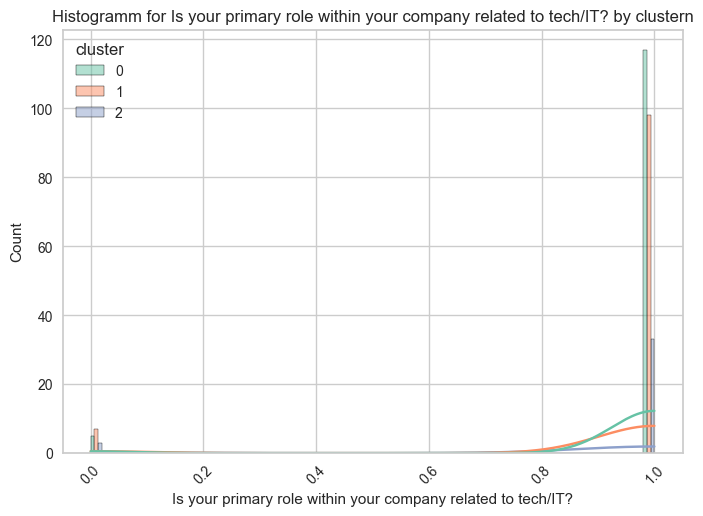

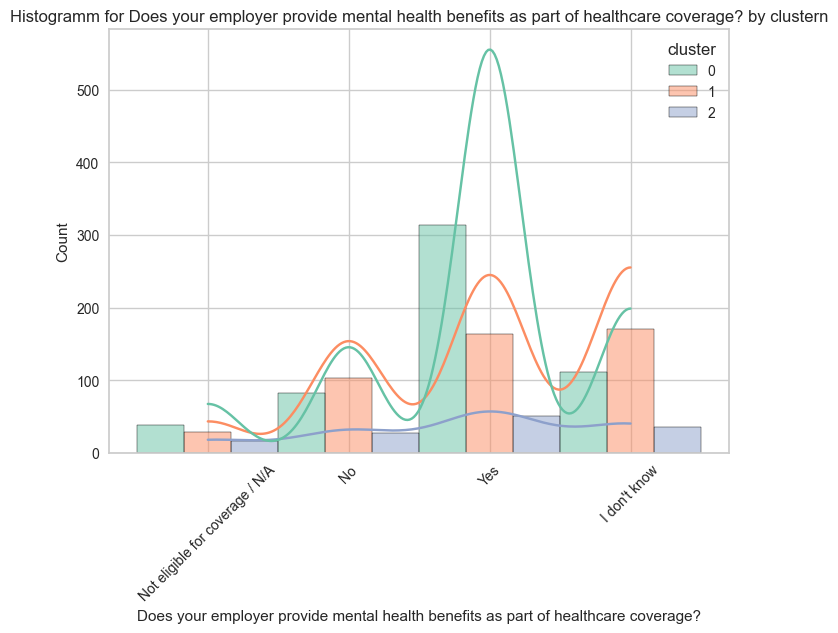

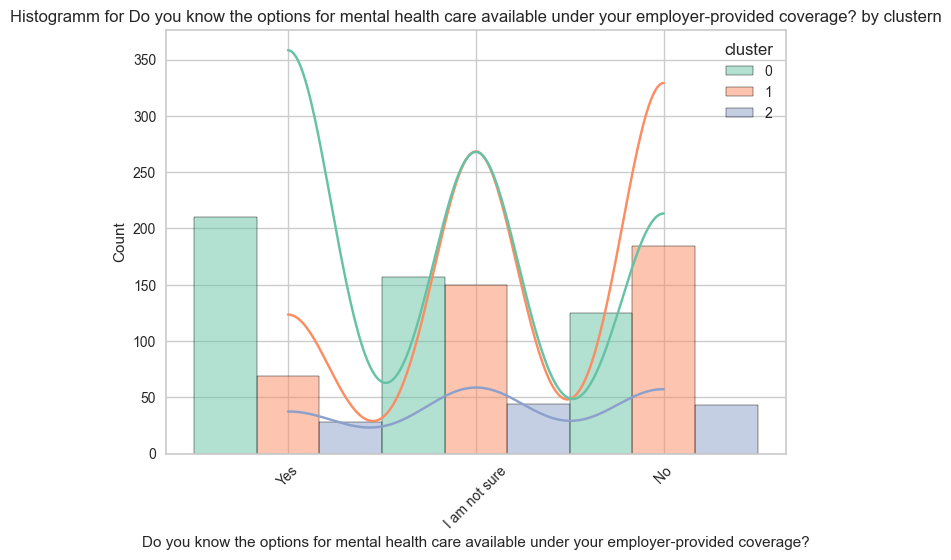

...

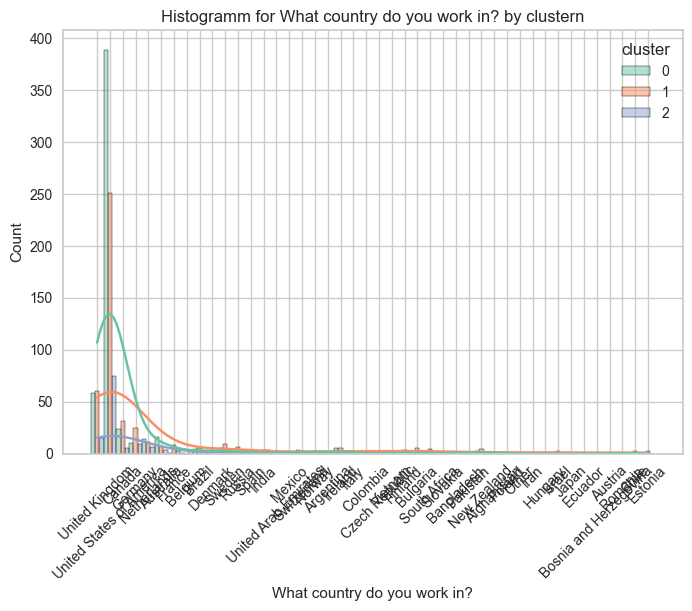

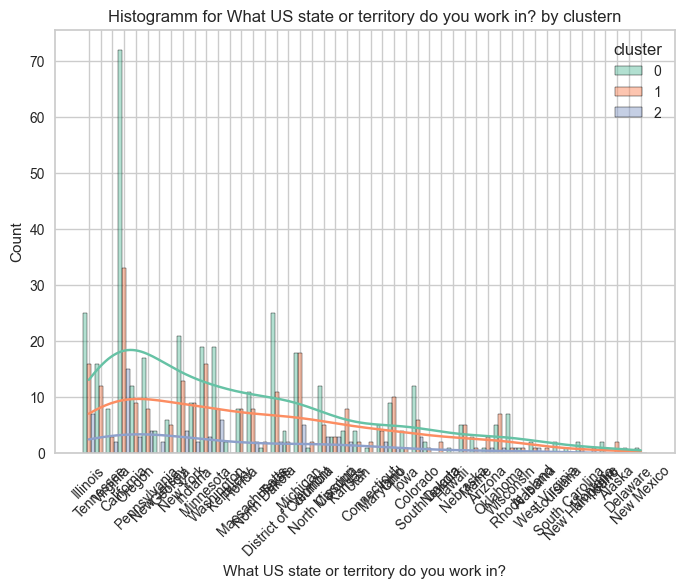

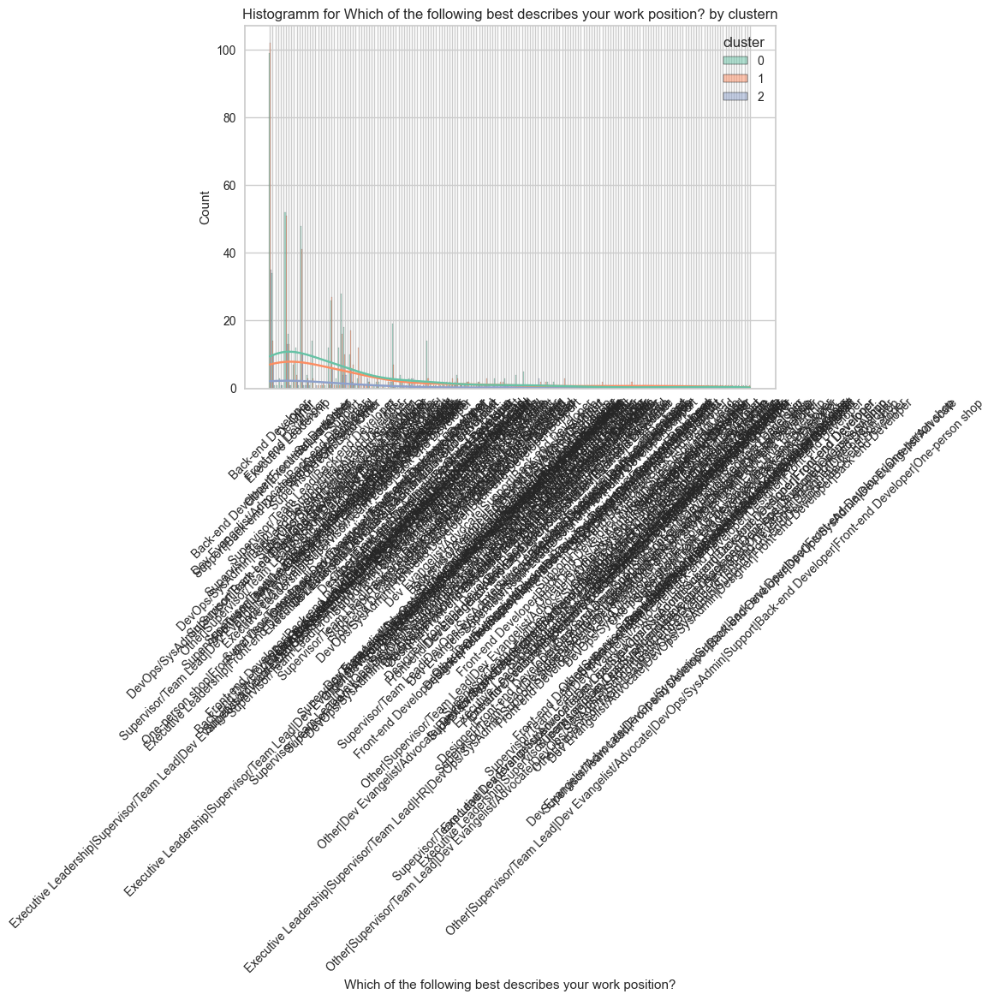

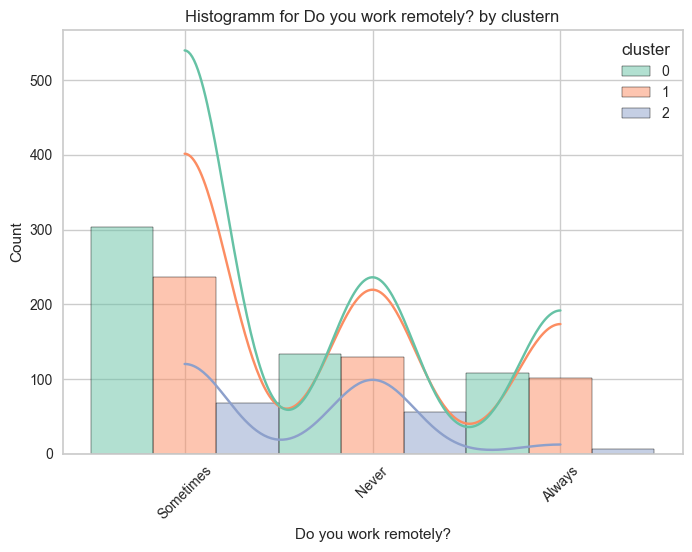

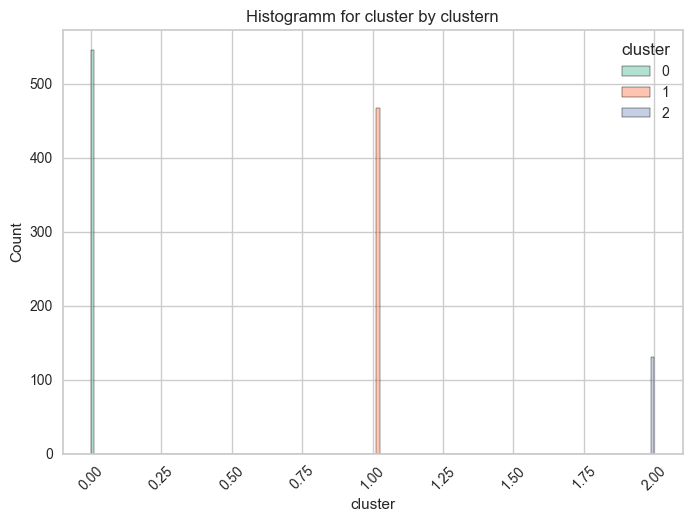

In [24]:
cluster_column = 'cluster'  # column for he cluster assignment

for feature in data.columns:

    # create the histogram
    sns.histplot(data=data, x=feature, bins=50, kde=True, hue=cluster_column, multiple="dodge", palette="Set2")
    plt.title(f'Histogramm for {feature} by clustern')
    plt.xticks(rotation=45) 
    plt.show()
